In [1]:
import matplotlib.pyplot as plt # Import the Matplotlib package
from osgeo import gdal # Import the GDAL library
import seaborn as sns
import os
import pandas as pd
from pathlib import Path
import georasters as gr
import datetime
import numpy as np
from pathlib import Path
import re

### manejo de grib para obtener alturas

In [2]:
#importo lista de path

directory_in_str = "/opt/datos/gfs/hgt_00/"
pathlist = Path(directory_in_str).glob('**/*')

lista_de_path = list()
lista_dates = list()
i=0
j=0

np_image = np.empty((10,137,157))

start_date = "2015-01-15 00:00"
finish_date = "2021-08-21 21:00"

idx = pd.date_range(start_date, finish_date, freq='3H').strftime("%Y-%m-%d %H:%M")

for path in pathlist:
    path_in_str = str(path)
    lista_de_path.append(path_in_str)
    
for time in idx:
    time_new = time.replace("-", "")
    time_new1 = time_new.replace(" ", "00.f0")
    time_new2 = time_new1.replace(":00", "")
    time_new3 = time_new2.replace("00.f000", "00.f024")
    lista_dates.append(time_new3)

#cant = len(lista_de_path) // 3
np_all_images = np.empty((19288,10,137,157))
    
for times in lista_dates:
    for file in lista_de_path:
        if(times in file):
            print(file)
            grib = gdal.Open(file)
            for i in range(1,11):
                band = grib.GetRasterBand(i)
                band_description = band.GetDescription()
                print(i,band_description)
                np_image[i-1,:,:] = band.ReadAsArray()
            if(".f024" in file):
                np_all_images[j+7] = np_image
            else:    
                np_all_images[j-1] = np_image
            j=j+1

/opt/datos/gfs/hgt_00/gfs.0p25.2015011500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015011500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015011500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015011700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015011700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015012000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015012000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015012300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015012300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015012500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015012500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015012800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015012800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015013000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015013000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015020200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015020200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015020500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015020500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015020800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015020800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015021100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015021100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015021400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015021400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015021700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015021700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2015021900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015021900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015022000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015022200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015022300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015022600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015022600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015022800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015022800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015030300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015030300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015030600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015030700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015030900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015030900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015031200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015031200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015031400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015031400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2015031700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015031700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015031700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015032000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015032000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015032300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015032300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015032600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015032600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015032900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015032900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015040100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015040100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015040300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015040300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015040600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015040600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015040800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015040900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015041200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015041200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015041500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015041500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobar

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015041700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015041700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015042000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015042000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015042300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015042300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015042500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015042600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015042800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015042800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2015043000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015050100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015050100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015050300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015050300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015050600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015050600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015050800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015050900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015051200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015051200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015051400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015051400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015051800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015051800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015052000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015052000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015052300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015052300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015052600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015052700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015053000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015053000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015060200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015060200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2015060400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015060400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015060400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015060700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015060800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015061000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015061000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015061300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015061300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015061500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015061600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015061800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015061800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015062100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015062100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015062300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015062300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015062600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015062600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2015062800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015062900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015062900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015070200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015070200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015070500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015070500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobar

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015070800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015070800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015071000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015071100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015071300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015071300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015071600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015071600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015071800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015071800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015072100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015072100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015072400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015072400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2015072700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015072700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015072700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015073000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015073000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015080200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015080200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015080500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015080500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobar

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015080800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015080800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2015081000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015081000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015081000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2015081300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015081300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015081300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015081500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015081500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015081800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015081800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015082100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015082100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015082400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015082400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015082400.f009.grib2
1 10000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015082700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015082700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015083000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015083000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015083000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015090200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015090200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobar

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015090500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015090500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015090800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015090800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015091100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015091100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015091400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015091400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015091600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015091600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015091900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015091900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015092200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015092200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015092600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015092600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015092600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015092900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015092900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015100100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015100100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015100400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015100400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015100600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015100700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015100900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015100900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015101200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015101200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015101500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015101500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015101800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015101800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2015102000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015102000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015102000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015102400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015102400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015102600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015102600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2015102900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015102900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015102900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015110100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015110100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015110300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015110300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015110600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015110600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015110900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015110900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015111200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015111200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015111500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015111500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015111500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015111800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015111800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015112000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015112000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015112300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015112300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015112300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

/opt/datos/gfs/hgt_00/gfs.0p25.2015112500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015112500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015112600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015112800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015112900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015120100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015120100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015120400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015120400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015120700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015120700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015120900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015120900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015121200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015121200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015121400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015121500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015121800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015121800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015122000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015122000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015122300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015122300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015122500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015122600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015122800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015122800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015123100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2015123100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016010200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016010200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016010500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016010500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016010800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016010800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016010800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016011000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016011100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016011300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016011300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016011600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016011600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016011800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016011800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016012100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016012100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016012300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016012400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016012600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016012600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2016012900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016012900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016012900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016020100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016020100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016020300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016020400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016020600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016020600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016020900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016020900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016021200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016021200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2016021500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016021500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016021500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016021700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016021800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobar

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016022000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016022000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016022300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016022300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016022500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016022500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016022800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016022800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016030200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016030200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016030500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016030500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016030700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016030700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016031000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016031000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016031300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016031300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016031500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016031500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016031500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016031800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016031800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016032100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016032100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016032300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016032400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016032600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016032600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016032900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016032900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016033100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016033100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016040300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016040400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016040600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016040600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016040900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016040900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016041200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016041200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016041500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016041500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016041800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016041800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2016042100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016042100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016042100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016042400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016042400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2016042700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016042700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016042700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016043000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016043000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016050300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016050300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016050600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016050600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016050800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016050900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2016051100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016051100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016051100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016051400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016051400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016051600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016051600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016051900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016051900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016052200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016052200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016052400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016052500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016052700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016052700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016053000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016053000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016060200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016060200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016060500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016060500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016060700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016060800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016061000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016061000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016061300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016061300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016061500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016061500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016061800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016061800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016062100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016062100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016062400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016062400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016062600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016062700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016062900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016062900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016070200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016070200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016070200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016070400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016070400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016070500.f024.grib2
1 10000

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016070700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016070800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016071000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016071000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016071300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016071300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016071500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016071600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2016071800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016071800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016071800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016072100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016072100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016072400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016072400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016072700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016072700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016073000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016073000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2016080100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016080100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016080200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016080400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016080400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016080700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016080700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016081000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016081000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016081300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016081300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016081600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016081600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016081600.f006.grib2
1 10000

/opt/datos/gfs/hgt_00/gfs.0p25.2016081900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016081900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016081900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016082100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016082100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016082400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016082400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016082700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016082700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016082900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016082900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016090100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016090100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016090500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016090500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016090700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016090700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016091100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016091100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016091400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016091400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016091600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016091600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016091900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016091900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016092200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016092200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016092400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016092500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016092700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016092800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016100100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016100100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016100300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016100400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016100400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016100600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016100700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016100900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016100900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016101200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016101300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016101500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016101500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016101800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016101800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016102100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016102200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016102400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016102400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2016102700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016102700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016102700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016103000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016103000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016110200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016110200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016110200.f009.grib2
1 10000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016110500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016110500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016110800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016110800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016111000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016111100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016111400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016111400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2016111600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016111600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016111600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016111800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016111900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016111900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016112100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016112100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016112400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016112400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016112700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016112700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016112900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016113000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016120200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016120200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016120500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016120500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016120700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016120700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016121000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016121000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016121000.f018.grib2
1 10000

/opt/datos/gfs/hgt_00/gfs.0p25.2016121300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016121300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016121300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016121600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016121700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016122000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016122000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016122200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016122200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016122500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016122500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016122700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016122800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016123000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2016123000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017010200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017010200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017010400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017010500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017010800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017010800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017011000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017011000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017011300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017011300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017011600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017011600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017011900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017011900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017012200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017012200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017012500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017012500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017012800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017012800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2017013000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017013100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017013100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017020200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017020300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017020500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017020500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2017020800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017020800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017020800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017021100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017021100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017021400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017021400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017021700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017021700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017022000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017022000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017022300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017022300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017022600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017022600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017022800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017022800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017030300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017030300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2017030600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017030600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017030600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017030900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017030900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017031100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017031100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017031400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017031400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017031600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017031700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017031900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017031900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017032200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017032200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017032500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017032500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017032700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017032700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017033000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017033000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017040100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017040100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017040400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017040400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017040600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017040600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2017040900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017040900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017040900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017041200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017041200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017041500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017041500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017041800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017041800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017042000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017042000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017042300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017042300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017042600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017042600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017042900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017042900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017050200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017050200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017050500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017050500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017050700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017050700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017051000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017051000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017051300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017051300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017051500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017051600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017051800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017051900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017052100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017052100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017052400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017052400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017052700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017052700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017053000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017053000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017053000.f006.grib2
1 10000

9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017060100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017060100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017060100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017060400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017060400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017060700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017060700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017061000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017061000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017061200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017061300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017061500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017061500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017061800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017061800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017062100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017062100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017062400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017062400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017062600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017062600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017062900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017062900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017070200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017070200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017070200.f015.grib2
1 10000

/opt/datos/gfs/hgt_00/gfs.0p25.2017070500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017070500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017070500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017070800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017070800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017071100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017071100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017071400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017071400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2017071600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017071600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017071600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017071900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017071900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017072200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017072200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017072500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017072500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017072800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017072800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017073100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017073100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017080200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017080200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017080500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017080500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017080800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017080800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017081000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017081000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017081300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017081300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017081600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017081600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017081900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017081900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017082200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017082200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017082500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017082500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017082800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017082800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017083100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017083100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017090200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017090200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017090500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017090500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017090800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017090800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017091100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017091200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017091400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017091400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017091700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017091700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017091900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017092000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017092300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017092300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017092500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017092500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2017092800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017092800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017092800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017100100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017100100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017100300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017100400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017100600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017100700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017101000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017101000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017101200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017101200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2017101500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017101500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017101500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017101800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017101800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017102000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017102000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017102300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017102300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017102500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017102600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017102800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017102800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017103100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017110100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017110400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017110400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2017110600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017110600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017110600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2017110900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017110900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017110900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017111100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017111200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017111400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017111400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017111700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017111700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017111700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017112000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017112000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017112300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017112300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017112500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017112600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017112800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017112800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017120100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017120100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017120400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017120400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017120700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017120700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017121000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017121000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017121000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017121300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017121300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017121500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017121600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017121800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017121900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017122100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017122200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017122400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017122400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017122700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017122700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2017122900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017122900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2017123000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018010100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018010100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018010400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018010400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018010700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018010700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018010900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018010900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018010900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018011200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018011200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018011200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018011500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018011500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018011800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018011800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018012000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018012100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018012400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018012400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018012600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018012600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018012900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018012900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018013000.f024.grib2
1 10000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018020100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018020100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018020400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018020400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018020700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018020700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018021000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018021000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018021200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018021300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018021600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018021600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018021800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018021800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2018022100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018022100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018022100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018022400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018022400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018022600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018022600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018030100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018030100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2018030400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018030400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018030400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018030600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018030700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018030900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018030900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018031200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018031200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018031500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018031500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018031800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018031800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018032100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018032100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018032300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018032400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018032600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018032700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018032900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018032900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018040100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018040100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018040400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018040400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018040600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018040700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018040900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018041000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018041200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018041200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018041400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018041500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018041800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018041800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018042100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018042100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018042300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018042300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018042600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018042600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018042900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018042900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2018050200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018050200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018050200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018050500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018050500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018050800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018050800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018051000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018051100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018051100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018051300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018051300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018051400.f024.grib2
1 10000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018051600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018051600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018051900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018051900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018052300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018052300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2018052500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018052500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018052500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018052800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018052800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018053100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018053100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018060200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018060300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018060500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018060500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018060800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018060800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018061200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018061200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018061500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018061500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018061700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018061800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018062000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018062000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018062300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018062300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018062500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018062500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018062600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018062800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018062800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018070100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018070100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018070400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018070400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018070700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018070700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018070700.f012.grib2
1 10000

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018070900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018071000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018071200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018071200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018071500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018071600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018071800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018071900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018072100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018072100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018072400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018072400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018072700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018072700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018073000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018073000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018080200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018080200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018080500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018080500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018080800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018080800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018081000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018081000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018081300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018081300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018081700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018081700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018082000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018082000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2018082300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018082300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018082300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018082600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018082600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018082900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018082900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018090100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018090100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018090400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018090400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018090700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018090700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018091000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018091000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018091300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018091300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018091600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018091600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018091900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018091900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018092200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018092200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018092500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018092500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018092800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018092800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018093000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018100100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018100100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018100400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018100400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018100400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018100700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018100700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018101000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018101000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018101300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018101300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018101600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018101600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018101900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018101900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018102200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018102200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2018102500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018102500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018102500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018102800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018102800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2018103100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018110100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018110100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018110400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018110400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018110700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018110700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018110700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018111000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018111000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018111300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018111300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018111600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018111600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018111900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018111900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018112300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018112300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018112600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018112600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018112600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018112900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018112900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018120200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018120300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018120500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018120500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018120800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018120800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018121100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018121100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018121400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018121400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018121700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018121800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2018122000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018122100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018122100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018122300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018122400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018122700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018122700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018123000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2018123000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019010100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019010100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019010500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019010500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019010800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019010800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019010800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019011100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019011200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019011500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019011500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019011500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019011800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019011800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019012000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019012100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019012100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019012400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019012400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019012600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019012600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019012900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019013000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019013000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019020200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019020200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019020500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019020500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019020800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019020800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019020900.f024.grib2
1 10000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019021200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019021200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019021500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019021500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019021800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019021800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019022100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019022100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019022300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019022400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019022700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019022700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019030200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019030200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019030400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019030400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019030700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019030700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019031000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019031100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019031300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019031300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019031600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019031700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019031900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019031900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019032200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019032200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019032200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019032500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019032500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019032800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019032800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019033100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019033100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019033100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019040300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019040400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019040600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019040700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019040900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019040900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019041200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019041200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019041200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019041500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019041500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019041500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019041800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019041800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019042100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019042100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019042400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019042400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019042700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019042700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobar

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019043000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019043000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019050300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019050300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019050600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019050600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019050900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019051000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019051300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019051300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019051600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019051600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019052000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019052000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019052300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019052300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019052300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019052600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019052600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019053000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019053000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019060100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019060200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019060500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019060500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019060500.f009.grib2
1 10000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019060800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019060800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019061100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019061100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019061400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019061400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019061700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019061800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019062100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019062100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019062300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019062400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019062600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019062700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019062700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019063000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019063000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019070300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019070300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019070600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019070600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019070900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019070900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019071200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019071200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019071500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019071500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019071900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019071900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019072100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019072200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019072500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019072500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019072800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019072900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019073100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019073100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019080300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019080300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019080500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019080600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019080800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019080800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019081000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019081100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019081400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019081400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019081700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019081700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019082000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019082000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019082300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019082300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019082300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2019082700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019082700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019082700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019083000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019083000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019083000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019090200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019090200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019090300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019090600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019090600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019090900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019090900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019091200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019091200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019091300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2019091600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019091600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019091600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2019091800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019091900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019091900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019092200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019092200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019092500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019092500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019092700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019092700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019092800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019100100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019100100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019100100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019100300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019100300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019100600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019100600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019100600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019100900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019100900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019101200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019101200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019101500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019101500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019101800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019101800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019102000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019102100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019102400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019102400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019102600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019102700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019102900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019102900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019110100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019110100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019110300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019110400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019110600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019110600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019110700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019110900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019110900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019111200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019111200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019111500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019111500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019111800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019111800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019112100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019112100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019112400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019112400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

/opt/datos/gfs/hgt_00/gfs.0p25.2019112700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019112700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019112700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019113000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019113000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019120200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019120200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019120200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019120500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019120500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019120700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019120700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019120800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019121000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019121000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019121300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019121300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019121600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019121600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019121600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019121900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019121900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019121900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019122200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019122200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019122200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019122500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019122500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019122700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019122800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2019123000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019123000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2019123000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020010200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020010200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020010400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020010400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020010400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020010700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020010700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020011100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020011100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020011100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020011400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020011400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020011700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020011700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020011700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020012000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020012000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020012200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020012200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020012500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020012500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020012500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020012800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020012800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020013000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020013000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020013100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020020300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020020300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020020500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020020500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020020500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020020900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020020900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020021200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020021200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020021400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020021400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020021800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020021800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020022000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020022000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020022400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020022400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020022700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020022700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020022900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020022900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020022900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020030300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020030300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020030500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020030500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020030800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020030800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020030800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020031100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020031100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020031400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020031400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020031700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020031700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020032000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020032000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020032300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020032300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020032600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020032600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobar

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020032900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020032900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020032900.f006.grib2
1 10000

/opt/datos/gfs/hgt_00/gfs.0p25.2020033100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020033100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020033100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2020040300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020040300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020040300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020040700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020040700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020041000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020041000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020041300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020041300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020041600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020041600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020041600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020041900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020041900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020042200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020042200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020042400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020042500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020042800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020042800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020050100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020050100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020050400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020050400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020050600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020050700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020050900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020051000.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020051200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020051300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020051500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020051500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020051800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020051800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020052100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020052100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020052400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020052400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020052700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020052700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020052700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000

/opt/datos/gfs/hgt_00/gfs.0p25.2020053000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020053000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020053000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020060200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020060200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020060400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020060500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020060700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020060700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020060800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020061000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020061000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020061300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020061300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020061600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020061600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020061900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020061900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020061900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020062200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020062300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020062500.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020062500.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020062800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020062800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020062800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020070100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020070100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020070400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020070400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020070700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020070700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020071000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020071000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020071300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020071300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020071300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2020071600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020071600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020071600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020071800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020071900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020072100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020072100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020072200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020072400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020072400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020072400.f015.grib2
1 10000

/opt/datos/gfs/hgt_00/gfs.0p25.2020072700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020072700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020072700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020073000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020073000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobar

/opt/datos/gfs/hgt_00/gfs.0p25.2020080200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020080200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020080200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020080400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020080400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020080700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020080700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020080700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020081000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020081000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020081300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020081300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020081600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020081600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020081600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020081900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020081900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020082100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020082100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020082100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020082400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020082400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020082400.f015.grib2
1 10000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020082700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020082700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020083000.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020083000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020090100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020090100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020090400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020090400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020090700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020090700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020090700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2020091000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020091000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020091000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020091300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020091300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020091600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020091600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020091900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020091900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020092200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020092200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020092400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020092500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020092500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020092800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020092800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020093000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020093000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020100300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020100300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020100600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020100600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020100800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020100900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020101200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020101200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020101200.f006.grib2
1 10000

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020101400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020101400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020101700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020101700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020102000.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020102000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020102300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020102300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020102300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020102600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020102600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020102900.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020102900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020102900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020103100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020110100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020110100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020110300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020110300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020110600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020110600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020110900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020110900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020110900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020111200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020111200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020111500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020111600.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020111800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020111800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020112100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020112100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020112100.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2020112400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020112400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020112400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020112700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020112700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020113000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020113000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020120300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020120300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020120600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020120600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020120900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020120900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020121100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020121200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020121400.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020121400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020121700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020121700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2020122000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020122000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020122000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020122300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020122300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020122600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020122600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020122600.f018.grib2
1 10000

/opt/datos/gfs/hgt_00/gfs.0p25.2020122900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020122900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2020122900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2021010200.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021010200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021010200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021010400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021010500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobar

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021010700.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021010800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021011100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021011100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021011400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021011400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021011700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021011700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021011900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021011900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021012200.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021012300.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021012600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021012600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021012700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021013000.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021013000.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021020200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021020200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021020200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021020500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021020500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021020800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021020800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021020800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2021021100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021021100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021021100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2021021300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021021400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021021400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021021700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021021700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021021900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021021900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021022200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021022200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021022500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021022500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021022800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021022800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021030300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021030300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021030300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021030600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021030600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021030900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021030900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021031200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021031200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021031200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2021031400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021031500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021031500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021031800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021031800.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021031800.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021032000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021032100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021032300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021032300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021032600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021032600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021032900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021032900.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021040100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021040100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021040100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021040300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021040300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021040600.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021040600.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021040600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021040900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021040900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021041200.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021041200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021041200.f012.grib2
1 10000

/opt/datos/gfs/hgt_00/gfs.0p25.2021041500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021041500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021041500.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021041700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021041700.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021042000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021042000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric

7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021042300.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021042300.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gf

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021042500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021042500.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021042800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021042800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021050100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021050100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021050100.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021050400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021050400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021050700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021050700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021051000.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021051000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021051300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021051300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021051300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021051600.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021051700.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021051900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021051900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021052200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021052200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021052500.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021052500.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021052800.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021052800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021053100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021053100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021060300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021060300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021060300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021060600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021060600.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021060900.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021060900.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021061200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021061200.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021061200.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021061600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021061600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021061800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021061800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021061800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2021062100.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021062100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021062100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2021062300.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021062400.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021062400.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021062700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021062700.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021063000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021063000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021070100.f024.grib2
1 10000

/opt/datos/gfs/hgt_00/gfs.0p25.2021070300.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021070300.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021070300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2021070600.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021070600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021070600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2021070800.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021070800.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021070800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2021071100.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021071100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021071200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2021071400.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021071400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021071400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2021071700.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021071700.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021071700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

/opt/datos/gfs/hgt_00/gfs.0p25.2021071900.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021071900.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021071900.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021072200.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021072200.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021072400.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021072500.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021072500.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021072800.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021072800.f003.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021073100.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021073100.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021080300.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021080300.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021080600.f006.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021080600.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021080800.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021080900.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021081100.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021081200.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021081400.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021081400.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021081400.f015.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021081700.f009.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021081700.f012.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric

/opt/datos/gfs/hgt_00/gfs.0p25.2021082000.f018.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021082000.f021.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"
/opt/datos/gfs/hgt_00/gfs.0p25.2021082100.f024.grib2
1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[P

### Validando X.npy

In [3]:
#print(np_all_images.shape)
#np_all_images
np.save("/opt/datos/gfs/X.npy",np_all_images)

In [2]:
np_all_images = np.load("/opt/datos/gfs/X.npy")

In [17]:
grib = gdal.Open('/opt/datos/gfs/hgt_00/gfs.0p25.2015011500.f024.grib2')
#grib = gdal.Open('/opt/datos/gfs/hgt_00/gfs.0p25.2015011600.f006.grib2')
#grib = gdal.Open('/opt/datos/gfs/temp/gfs.0p25.2015040118.f006.grib2')
#grib = gdal.Open('/opt/datos/gfs/hgt_00/gfs.0p25.2021082100.f021.grib2')

In [18]:
np_hgt = np.empty((1,10,137,157))

for i in range(1,11):
    band = grib.GetRasterBand(i)
    band_description = band.GetDescription()
    print(i,band_description)
    np_hgt[0,i-1,:,:] = band.ReadAsArray()

1 10000[Pa] ISBL="Isobaric surface"
2 20000[Pa] ISBL="Isobaric surface"
3 30000[Pa] ISBL="Isobaric surface"
4 40000[Pa] ISBL="Isobaric surface"
5 50000[Pa] ISBL="Isobaric surface"
6 60000[Pa] ISBL="Isobaric surface"
7 70000[Pa] ISBL="Isobaric surface"
8 80000[Pa] ISBL="Isobaric surface"
9 90000[Pa] ISBL="Isobaric surface"
10 100000[Pa] ISBL="Isobaric surface"


Text(0.5, 1.0, 'hgt-1000')

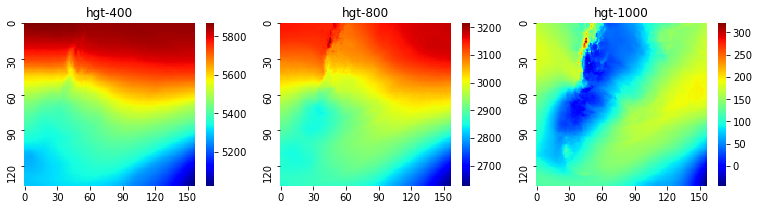

In [57]:
fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(13,3))

g1 = sns.heatmap(np_hgt[0,4,:,:],cmap="jet",cbar=True, ax=ax1, xticklabels=30, yticklabels=30)
g1.set_title('hgt-400')
g2 = sns.heatmap(np_hgt[0,6,:,:],cmap="jet",cbar=True, ax=ax2, xticklabels=30, yticklabels=30)
g2.set_title('hgt-800')
g3 = sns.heatmap(np_hgt[0,9,:,:],cmap="jet",cbar=True, ax=ax3, xticklabels=30, yticklabels=30)
g3.set_title('hgt-1000')

Text(0.5, 1.0, 'hgt-1000')

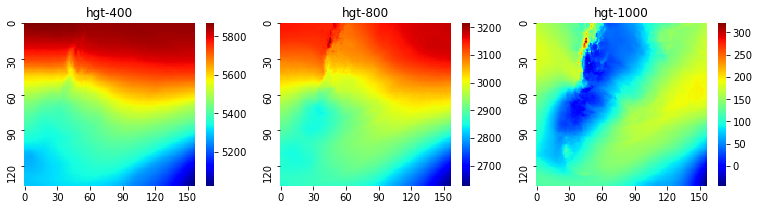

In [59]:
fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(13,3))

g1 = sns.heatmap(np_all_images[19287,4,:,:],cmap="jet",cbar=True, ax=ax1, xticklabels=30, yticklabels=30)
g1.set_title('hgt-400')
g2 = sns.heatmap(np_all_images[19287,6,:,:],cmap="jet",cbar=True, ax=ax2, xticklabels=30, yticklabels=30)
g2.set_title('hgt-800')
g3 = sns.heatmap(np_all_images[19287,9,:,:],cmap="jet",cbar=True, ax=ax3, xticklabels=30, yticklabels=30)
g3.set_title('hgt-1000')

In [19]:
np.array_equal(np_all_images[7,9,:,:], np_hgt[0,9,:,:])

True

### Obtencion de fechas ordenadas

In [59]:
#importo lista de path

directory_in_str = "/opt/datos/gfs/hgt_00/" #dentro de ....
pathlist = Path(directory_in_str).glob('**/*') #todos los tiff de 100000 ISBL

In [66]:
lista_dates = list()

start_date = "2015-01-15 00:00"
finish_date = "2021-08-21 21:00"
idx = pd.date_range(start_date, finish_date, freq='3H').strftime("%Y-%m-%d %H:%M")
# 2015010600.f003.
# 2015-01-15 09:00
l = 0
for time in idx:
    time_new = time.replace("-", "")
    time_new1 = time_new.replace(" ", "00.f0")
    time_new2 = time_new1.replace(":00", "")
    time_new3 = time_new2.replace("00.f000", "00.f024")
    print(time_new3)
    lista_dates.append(time_new2)
    l = l+1
print(l)

2015011500.f024
2015011500.f003
2015011500.f006
2015011500.f009
2015011500.f012
2015011500.f015
2015011500.f018
2015011500.f021
2015011600.f024
2015011600.f003
2015011600.f006
2015011600.f009
2015011600.f012
2015011600.f015
2015011600.f018
2015011600.f021
2015011700.f024
2015011700.f003
2015011700.f006
2015011700.f009
2015011700.f012
2015011700.f015
2015011700.f018
2015011700.f021
2015011800.f024
2015011800.f003
2015011800.f006
2015011800.f009
2015011800.f012
2015011800.f015
2015011800.f018
2015011800.f021
2015011900.f024
2015011900.f003
2015011900.f006
2015011900.f009
2015011900.f012
2015011900.f015
2015011900.f018
2015011900.f021
2015012000.f024
2015012000.f003
2015012000.f006
2015012000.f009
2015012000.f012
2015012000.f015
2015012000.f018
2015012000.f021
2015012100.f024
2015012100.f003
2015012100.f006
2015012100.f009
2015012100.f012
2015012100.f015
2015012100.f018
2015012100.f021
2015012200.f024
2015012200.f003
2015012200.f006
2015012200.f009
2015012200.f012
2015012200.f015
20150122

2016060600.f024
2016060600.f003
2016060600.f006
2016060600.f009
2016060600.f012
2016060600.f015
2016060600.f018
2016060600.f021
2016060700.f024
2016060700.f003
2016060700.f006
2016060700.f009
2016060700.f012
2016060700.f015
2016060700.f018
2016060700.f021
2016060800.f024
2016060800.f003
2016060800.f006
2016060800.f009
2016060800.f012
2016060800.f015
2016060800.f018
2016060800.f021
2016060900.f024
2016060900.f003
2016060900.f006
2016060900.f009
2016060900.f012
2016060900.f015
2016060900.f018
2016060900.f021
2016061000.f024
2016061000.f003
2016061000.f006
2016061000.f009
2016061000.f012
2016061000.f015
2016061000.f018
2016061000.f021
2016061100.f024
2016061100.f003
2016061100.f006
2016061100.f009
2016061100.f012
2016061100.f015
2016061100.f018
2016061100.f021
2016061200.f024
2016061200.f003
2016061200.f006
2016061200.f009
2016061200.f012
2016061200.f015
2016061200.f018
2016061200.f021
2016061300.f024
2016061300.f003
2016061300.f006
2016061300.f009
2016061300.f012
2016061300.f015
20160613

2017092600.f018
2017092600.f021
2017092700.f024
2017092700.f003
2017092700.f006
2017092700.f009
2017092700.f012
2017092700.f015
2017092700.f018
2017092700.f021
2017092800.f024
2017092800.f003
2017092800.f006
2017092800.f009
2017092800.f012
2017092800.f015
2017092800.f018
2017092800.f021
2017092900.f024
2017092900.f003
2017092900.f006
2017092900.f009
2017092900.f012
2017092900.f015
2017092900.f018
2017092900.f021
2017093000.f024
2017093000.f003
2017093000.f006
2017093000.f009
2017093000.f012
2017093000.f015
2017093000.f018
2017093000.f021
2017100100.f024
2017100100.f003
2017100100.f006
2017100100.f009
2017100100.f012
2017100100.f015
2017100100.f018
2017100100.f021
2017100200.f024
2017100200.f003
2017100200.f006
2017100200.f009
2017100200.f012
2017100200.f015
2017100200.f018
2017100200.f021
2017100300.f024
2017100300.f003
2017100300.f006
2017100300.f009
2017100300.f012
2017100300.f015
2017100300.f018
2017100300.f021
2017100400.f024
2017100400.f003
2017100400.f006
2017100400.f009
20171004

2019022500.f006
2019022500.f009
2019022500.f012
2019022500.f015
2019022500.f018
2019022500.f021
2019022600.f024
2019022600.f003
2019022600.f006
2019022600.f009
2019022600.f012
2019022600.f015
2019022600.f018
2019022600.f021
2019022700.f024
2019022700.f003
2019022700.f006
2019022700.f009
2019022700.f012
2019022700.f015
2019022700.f018
2019022700.f021
2019022800.f024
2019022800.f003
2019022800.f006
2019022800.f009
2019022800.f012
2019022800.f015
2019022800.f018
2019022800.f021
2019030100.f024
2019030100.f003
2019030100.f006
2019030100.f009
2019030100.f012
2019030100.f015
2019030100.f018
2019030100.f021
2019030200.f024
2019030200.f003
2019030200.f006
2019030200.f009
2019030200.f012
2019030200.f015
2019030200.f018
2019030200.f021
2019030300.f024
2019030300.f003
2019030300.f006
2019030300.f009
2019030300.f012
2019030300.f015
2019030300.f018
2019030300.f021
2019030400.f024
2019030400.f003
2019030400.f006
2019030400.f009
2019030400.f012
2019030400.f015
2019030400.f018
2019030400.f021
20190305

2020071200.f024
2020071200.f003
2020071200.f006
2020071200.f009
2020071200.f012
2020071200.f015
2020071200.f018
2020071200.f021
2020071300.f024
2020071300.f003
2020071300.f006
2020071300.f009
2020071300.f012
2020071300.f015
2020071300.f018
2020071300.f021
2020071400.f024
2020071400.f003
2020071400.f006
2020071400.f009
2020071400.f012
2020071400.f015
2020071400.f018
2020071400.f021
2020071500.f024
2020071500.f003
2020071500.f006
2020071500.f009
2020071500.f012
2020071500.f015
2020071500.f018
2020071500.f021
2020071600.f024
2020071600.f003
2020071600.f006
2020071600.f009
2020071600.f012
2020071600.f015
2020071600.f018
2020071600.f021
2020071700.f024
2020071700.f003
2020071700.f006
2020071700.f009
2020071700.f012
2020071700.f015
2020071700.f018
2020071700.f021
2020071800.f024
2020071800.f003
2020071800.f006
2020071800.f009
2020071800.f012
2020071800.f015
2020071800.f018
2020071800.f021
2020071900.f024
2020071900.f003
2020071900.f006
2020071900.f009
2020071900.f012
2020071900.f015
20200719